**Problem statement:**

The sinking of the Titanic is one of the most infamous shipwrecks in history.

On April 15, 1912, during her maiden voyage, the widely considered “unsinkable” RMS Titanic sank after colliding with an iceberg. Unfortunately, there weren’t enough lifeboats for everyone onboard, resulting in the death of 1502 out of 2224 passengers and crew.

While there was some element of luck involved in surviving, it seems some groups of people were more likely to survive than others.

**In this challenge, we ask you to build a predictive model that answers the question: “what sorts of people were more likely to survive?”** using passenger data (ie name, age, gender, socio-economic class, etc).


**Data Used in Problem:**

Two similar datasets that include passenger information like name, age, gender, socio-economic class, etc. One dataset is titled *'Train.csv'* and the other is titled *'test.csv'*.

The *'Train.csv'* will contain the details of a subset of the passengers on board (891 to be exact) and importantly, will reveal whether they survived or not, also known as the “ground truth”.

The *' test.csv '* dataset contains similar information but does not disclose the “ground truth” for each passenger. It’s your job to predict these outcomes.

**Data Dictionary**
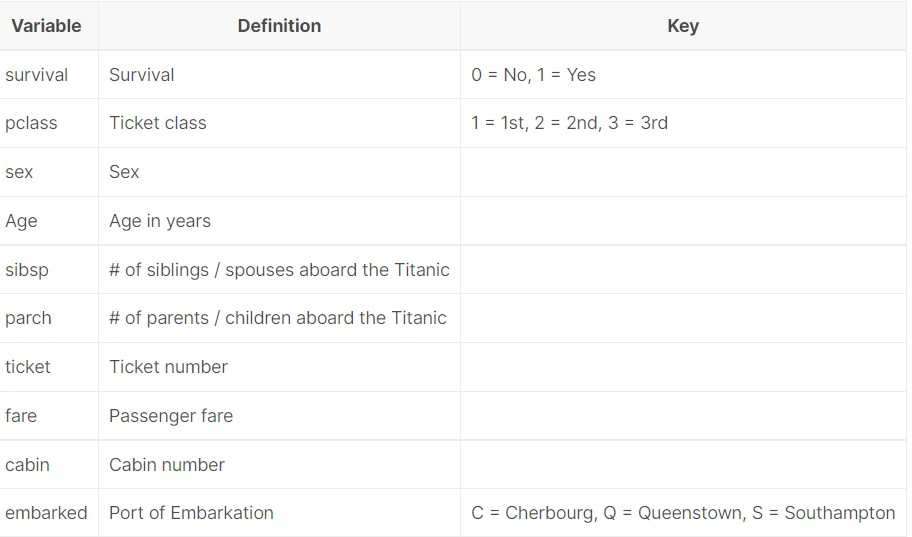


---

**Variable Notes:**

pclass: A proxy for socio-economic status (SES)
1st = Upper
2nd = Middle
3rd = Lower

age: Age is fractional if less than 1. If the age is estimated, is it in the form of xx.5

sibsp: The dataset defines family relations in this way...
Sibling = brother, sister, stepbrother, stepsister
Spouse = husband, wife (mistresses and fiancés were ignored)

parch: The dataset defines family relations in this way...
Parent = mother, father
Child = daughter, son, stepdaughter, stepson
Some children travelled only with a nanny, therefore parch=0 for them.

**The 7 Key Steps To Build Machine Learning Model**

Step 1: Collect Data

Step 2: Prepare the data.
 
Step 3: Choose the model.
 
Step 4 Train your machine model.
 
Step 5: Evaluation. 

Step 6: Parameter Tuning.
 
Step 7: Prediction or Inference.


**Note to self , Read this mohak:**-
This is a **classification problem** where  in we are trying to predict whether a person traveling on titanic is likely to survive on not.

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     / 22.0 MB 138 kB/s
     |████████████████████████████████| 102 kB 21.9 MB/s 
     |████████████████████████████████| 690 kB 49.1 MB/s 
     |████████████████████████████████| 62 kB 1.6 MB/s 
     |████████████████████████████████| 9.9 MB 50.8 MB/s 
     |████████████████████████████████| 4.7 MB 45.9 MB/s 
     |████████████████████████████████| 296 kB 56.3 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.4.0-py2.py3-none-any.whl size=315269 sha256=fb18703747847df588c45db5cf0c9060e45377b4e1353a2047db96f9b74ab2f2
  Stored in directory: /tmp/pip-ephem-wheel-cache-ubum9utw/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=25eaab3dee05bcb34b35d6667d658f9b7b2a0d6ddf757a4c848f1ae13e86de22
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba86876882394

In [ ]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import missingno as msno
from pandas_profiling import ProfileReport
import scipy as scp

In [ ]:
train=pd.read_csv("train.csv")

In [ ]:
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [ ]:
profile=ProfileReport(train)

In [ ]:
profile.to_notebook_iframe()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
profile.to_widgets()

In [ ]:
profile.to_file(output_file="Titanic.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
train.columns

Index(['PassengerId', 'Survived', 'Pclass', 'Name', 'Sex', 'Age', 'SibSp',
       'Parch', 'Ticket', 'Fare', 'Cabin', 'Embarked'],
      dtype='object')

In [ ]:
train.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [ ]:
missing_percentage = ((train.isnull().sum()*100)/len(train))
missing_percentage

PassengerId     0.000000
Survived        0.000000
Pclass          0.000000
Name            0.000000
Sex             0.000000
Age            19.865320
SibSp           0.000000
Parch           0.000000
Ticket          0.000000
Fare            0.000000
Cabin          77.104377
Embarked        0.224467
dtype: float64

In [ ]:
train.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [ ]:
print("The data type of column age is :",train['Age'].dtype)

The data type of column age is : float64


In [ ]:
print("The Mean Age of a person travelling on ship is",train['Age'].mean())
print("The Mode of Age of a person travelling on ship is",train['Age'].mode())
print("The Median of Age of a person travelling on ship is",train['Age'].median())

The Mean Age of a person travelling on ship is 29.69911764705882
The Mode of Age of a person travelling on ship is 0    24.0
dtype: float64
The Median of Age of a person travelling on ship is 28.0


In [ ]:
print("The data type of column Cabin is :",train['Cabin'].dtype)

The data type of column Cabin is : object


In [ ]:
print("The Mode of Cabin is",train['Cabin'].mode())

The Mode of Cabin is 0        B96 B98
1    C23 C25 C27
2             G6
dtype: object
